## Atributos do Dataset:
**MedInc**: Renda mediana dos residentes do bairro (em dezenas de milhares de dólares).\
**HouseAge**: Idade mediana das casas no bairro.\
**AveRooms**: Número médio de cômodos por casa.\
**AveBedrms**: Número médio de quartos por casa.\
**Population**: População do bairro.\
**AveOccup**: Número médio de ocupantes por casa.\
**Latitude**: Latitude do bairro.\
**Longitude**: Longitude do bairro.

### Variável Alvo:
**MedHouseVal**: Valor mediano das casas no bairro (em centenas de milhares de dólares).


#### Data
https://data.ca.gov/

**Public Schools 2021-22**: https://data.ca.gov/dataset/california-schools-2021-22 \
**Private Schools 2025**: https://data.ca.gov/dataset/california-private-schools \
**Hospitals**: https://data.ca.gov/dataset/california-hospital-ratings-for-transcatheter-aortic-valve-replacement-tavr-procedures/resource/5998424f-7cbe-4833-b7e5-d8d87c81cb27 \
**Food Affordability**: https://data.ca.gov/dataset/food-affordability \
**Counties Coordinates**: https://raw.githubusercontent.com/codeforgermany/click_that_hood/master/public/data/california-counties.geojson \



##### Possible Data?

**Distance to Public Tranpsort**: https://data.ca.gov/dataset/walkable-distance-to-public-transit/resource/562989a9-7e40-4acb-bc74-d900fda4d0c5?view_id=ade33276-88ed-4a55-b858-84bcf55a7f04 \
**Water Quality**: https://data.ca.gov/dataset/surface-water-2018-california-water-quality-status-report



In [450]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [451]:
df = pd.read_csv('data/processed/california_housing.csv')
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [452]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   MedHouseVal  20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


In [453]:
num_columns = ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'MedHouseVal']
df[num_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
MedInc,20640.0,3.870671,1.899822,0.499900,2.563400,3.534800,4.743250,15.000100
HouseAge,20640.0,28.639486,12.585558,1.000000,18.000000,29.000000,37.000000,52.000000
AveRooms,20640.0,5.429000,2.474173,0.846154,4.440716,5.229129,6.052381,141.909091
AveBedrms,20640.0,1.096675,0.473911,0.333333,1.006079,1.048780,1.099526,34.066667
Population,20640.0,1425.476744,1132.462122,3.000000,787.000000,1166.000000,1725.000000,35682.000000
AveOccup,20640.0,3.070655,10.386050,0.692308,2.429741,2.818116,3.282261,1243.333333
MedHouseVal,20640.0,2.068558,1.153956,0.149990,1.196000,1.797000,2.647250,5.000010


In [454]:
import geopandas as gpd
from shapely.geometry import point
# Load the shapely file
gdf = gpd.read_file("https://raw.githubusercontent.com/codeforgermany/click_that_hood/master/public/data/california-counties.geojson")

# Ensure the dataframe has geometry points
geometry = gpd.points_from_xy(df['Longitude'], df['Latitude'])
df_geo = gpd.GeoDataFrame(df, geometry=geometry, crs=gdf.crs)

# Perform spatial join to find the county for each point
df_geo = gpd.sjoin(df_geo, gdf[['geometry', 'name']], how='left', predicate='intersects')

# Add the 'County' column back to the original dataframe
df['County'] = df_geo['name']

In [455]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   MedHouseVal  20640 non-null  float64
 9   County       20349 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [456]:
df[df['County'].isnull()].count()

MedInc         291
HouseAge       291
AveRooms       291
AveBedrms      291
Population     291
AveOccup       291
Latitude       291
Longitude      291
MedHouseVal    291
County           0
dtype: int64

In [457]:
df.dropna(subset='County', inplace=True)

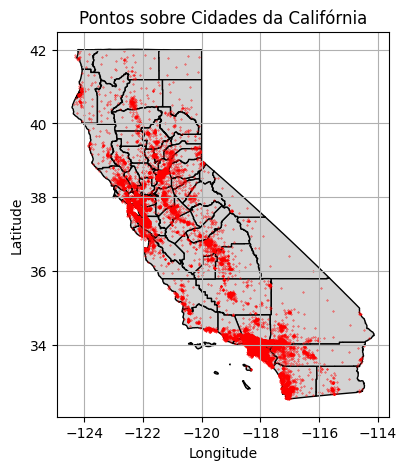

In [458]:
fig, ax = plt.subplots(figsize=(6,5))
gdf.plot(ax=ax, color='lightgray', edgecolor='black')
df_geo.plot(ax=ax, color='red', markersize=0.1)
plt.title("Pontos sobre Cidades da Califórnia")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.show()
# Muitos dos pontos não estão mapeados em nosso geodf

#### Escolhendo colunas uteis dos dataframe adicionais

In [459]:
df_public_schools = pd.read_csv("data/raw/schools/public_schools(2021-2022).csv")
df_public_schools.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9992 entries, 0 to 9991
Data columns (total 70 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   OBJECTID                             9992 non-null   int64  
 1   Year                                 9992 non-null   object 
 2   Fed ID                               9992 non-null   int64  
 3   CDS Code                             9992 non-null   int64  
 4   District Code                        9992 non-null   int64  
 5   School Code                          9992 non-null   int64  
 6   Region                               9991 non-null   float64
 7   County Name                          9992 non-null   object 
 8   District Name                        9992 non-null   object 
 9   School Name                          9992 non-null   object 
 10  School Type                          9992 non-null   object 
 11  Status                        

In [460]:
df_public_schools.rename(columns={'County Name':'County'}, inplace=True)

In [461]:
df_public_schools['County']

0       Alameda
1       Alameda
2       Alameda
3       Alameda
4       Alameda
         ...   
9987       Yuba
9988       Yuba
9989       Yuba
9990       Yuba
9991       Yuba
Name: County, Length: 9992, dtype: object

In [462]:
df_public_schools[df_public_schools['County'].isna()].count().sum()

0

In [463]:
df_public_schools[df_public_schools['School Code'].duplicated(keep=False)]

,OBJECTID,Year,Fed ID,CDS Code,District Code,School Code,Region,County,District Name,School Name,...,Migrant,Migrant (%),Socioeconomically Disadvantaged,Socioeconomically Disadvantaged (%),Students with Disabilities,Students with Disabilities (%),Free/Reduced Meal Eligible,Free/Reduced Meal Eligible (%),x,y


In [464]:
public_schools_per_county = df_public_schools.groupby('County')['School Code'].count().sort_values(ascending=False).reset_index()
public_schools_per_county.rename(columns={'School Code': 'Quantity'}, inplace=True)
public_schools_per_county.head()

,County,Quantity
0,Los Angeles,2186
1,San Diego,758
2,Orange,622
3,San Bernardino,555
4,Riverside,497


In [465]:
df_private_schools = pd.read_csv('data/raw/schools/private_schools(2025).csv')
df_private_schools.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3076 entries, 0 to 3075
Data columns (total 79 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   _id                              3076 non-null   int64  
 1   X                                2955 non-null   float64
 2   Y                                2955 non-null   float64
 3   ObjectID                         3076 non-null   int64  
 4   Loc_name                         2955 non-null   object 
 5   Status                           3076 non-null   object 
 6   Score                            3076 non-null   float64
 7   Match_type                       3076 non-null   object 
 8   Match_addr                       2955 non-null   object 
 9   User_fld                         2164 non-null   float64
 10  Addr_type                        2955 non-null   object 
 11  Side                             789 non-null    object 
 12  ARC_Street          

In [466]:
df_private_schools[df_private_schools['County'].isna()].count()

_id                               3
X                                 3
Y                                 3
ObjectID                          3
Loc_name                          3
                                 ..
Director_PrincipalOfficerEmail    1
CustodianofRecordsSalutation      2
CustodianofRecordsFirstName       3
CustodianofRecordsLastName        3
CustodianofRecordsEmail           1
Length: 79, dtype: int64

In [467]:
df_private_schools.dropna(subset='County', inplace=True)

In [468]:
df_private_schools.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3073 entries, 0 to 3072
Data columns (total 79 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   _id                              3073 non-null   int64  
 1   X                                2952 non-null   float64
 2   Y                                2952 non-null   float64
 3   ObjectID                         3073 non-null   int64  
 4   Loc_name                         2952 non-null   object 
 5   Status                           3073 non-null   object 
 6   Score                            3073 non-null   float64
 7   Match_type                       3073 non-null   object 
 8   Match_addr                       2952 non-null   object 
 9   User_fld                         2161 non-null   float64
 10  Addr_type                        2952 non-null   object 
 11  Side                             789 non-null    object 
 12  ARC_Street               

In [469]:
df_private_schools['ObjectID'].count()

3073

In [470]:
df_private_schools['County']

0       Alameda
1       Alameda
2       Alameda
3       Alameda
4       Alameda
         ...   
3068       Yolo
3069       Yolo
3070       Yolo
3071       Yuba
3072       Yuba
Name: County, Length: 3073, dtype: object

In [471]:
private_schools_per_county = df_private_schools.groupby('County')['ObjectID'].count().sort_values(ascending=False).reset_index()
private_schools_per_county.rename(columns={'ObjectID': 'Quantity'}, inplace=True)
private_schools_per_county.head()

,County,Quantity
0,Los Angeles,898
1,Orange,280
2,San Diego,227
3,Santa Clara,176
4,Alameda,133


In [472]:
# Juntando escolas públicas e particulares
df_schools_per_county = pd.merge(
    public_schools_per_county,
    private_schools_per_county,
    on = 'County',
    how = 'outer'
)

df_schools_per_county.head(2)

,County,Quantity_x,Quantity_y
0,Alameda,369,133.0
1,Alpine,2,NaN


In [473]:
df_schools_per_county.rename(columns={'Quantity_x': 'Public Schools', 'Quantity_y': 'Private Schools'}, inplace=True)

df_schools_per_county.fillna(0, inplace=True)

df_schools_per_county['Public Schools'] = df_schools_per_county['Public Schools'].astype(int)
df_schools_per_county['Private Schools'] = df_schools_per_county['Private Schools'].astype(int)

In [474]:
# Add a total schools column
df_schools_per_county['Total Schools'] = df_schools_per_county['Public Schools'] + df_schools_per_county['Private Schools']

df_schools_per_county.sort_values(by='Total Schools', ascending=False).head()

,County,Public Schools,Private Schools,Total Schools
18,Los Angeles,2186,898,3084
36,San Diego,758,227,985
29,Orange,622,280,902
35,San Bernardino,555,131,686
32,Riverside,497,130,627


In [475]:
df_schools_per_county = df_schools_per_county.drop(columns=['Public Schools', 'Private Schools'])
df_schools_per_county.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   County         58 non-null     object
 1   Total Schools  58 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 1.0+ KB


In [476]:
df_hospitals = pd.read_csv('data/raw/hospitals/2018-2022-california-hospital-performance-coronary.csv')
df_hospitals.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1462 entries, 0 to 1461
Data columns (total 20 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Year                                                          1461 non-null   object 
 1   County                                                        1461 non-null   object 
 2   Hospital                                                      1461 non-null   object 
 3   Hospital ID                                                   1461 non-null   float64
 4   Performance Measure                                           1461 non-null   object 
 5   Total Statewide CABG Cases                                    1461 non-null   object 
 6   Total Statewide CABG Cases for Performance Measure Reporting  1461 non-null   object 
 7   Statewide Adverse Events                                      1461 no

In [477]:
df_hospitals[df_hospitals['County'].isna()].count()

Year                                                            0
County                                                          0
Hospital                                                        0
Hospital ID                                                     0
Performance Measure                                             0
Total Statewide CABG Cases                                      0
Total Statewide CABG Cases for Performance Measure Reporting    0
Statewide Adverse Events                                        0
Statewide Adverse Events Rate (%)                               0
Total Hospital CABG Cases                                       0
Total Hospital CABG Cases for Performance Measure Reporting     0
Hospital Adverse Events                                         0
Hospital Observed Adverse Events Rate (%)                       0
Hospital Expected Adverse Events Rate (%)                       0
Hospital Risk-Adjusted Adverse Events Rate (%,RAAER)            0
Hospital L

In [478]:
hospital_per_county = df_hospitals.groupby("County")['Hospital ID'].count().sort_values(ascending=False).reset_index()
hospital_per_county.rename(columns={'Hospital ID': 'Hospital_Count'}, inplace=True)
hospital_per_county.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   County          30 non-null     object
 1   Hospital_Count  30 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 608.0+ bytes


In [479]:
df_transport = pd.read_excel('data/raw/public transport/walkable_distance_to_public_transportation.xlsx')
df_transport.info()

/home/rafanog/.local/lib/python3.10/site-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")
/home/rafanog/.local/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:223: UserWarning: Cell V27176 is marked as a date but the serial value 1694046482.752 is outside the limits for dates. The cell will be treated as an error.
  warn(msg)
/home/rafanog/.local/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:223: UserWarning: Cell V27177 is marked as a date but the serial value 1694046482.794 is outside the limits for dates. The cell will be treated as an error.
  warn(msg)
/home/rafanog/.local/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:223: UserWarning: Cell V27178 is marked as a date but the serial value 1694046482.813 is outside the limits for dates. The cell will be treated as an error.
  warn(msg)
/home/rafanog/.local/li

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66010 entries, 0 to 66009
Data columns (total 28 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ind_id          66010 non-null  object        
 1   ind_definition  66006 non-null  object        
 2   reportyear      66006 non-null  object        
 3   race_eth_code   66006 non-null  object        
 4   race_eth_name   66006 non-null  object        
 5   geotype         66006 non-null  object        
 6   geotypevalue    66006 non-null  object        
 7   geoname         65952 non-null  object        
 8   county_name     65943 non-null  object        
 9   county_fips     65943 non-null  object        
 10  region_name     66006 non-null  object        
 11  region_code     66006 non-null  object        
 12  pop_trans_acc   64824 non-null  float64       
 13  pop2010         66006 non-null  float64       
 14  p_trans_acc     64449 non-null  float64       
 15  LL

In [480]:
len(df_transport['county_name'].unique())

20

In [481]:
transport_available_per_county = df_transport.groupby('county_name')['pop_trans_acc'].sum().sort_values(ascending=False).reset_index()
transport_available_per_county.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19 entries, 0 to 18
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   county_name    19 non-null     object 
 1   pop_trans_acc  19 non-null     float64
dtypes: float64(1), object(1)
memory usage: 432.0+ bytes


In [482]:
transport_available_per_county['county_name'] = transport_available_per_county['county_name'].str.replace('_x0020_', ' ', regex=False)
transport_available_per_county.rename(columns={'pop_trans_acc': 'Transport Available', 'county_name': 'County'}, inplace=True)
transport_available_per_county.info()

# Quantidade de pessoas com acesso á um bom ponto de transporte público ( < 15 min de distancia)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19 entries, 0 to 18
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   County               19 non-null     object 
 1   Transport Available  19 non-null     float64
dtypes: float64(1), object(1)
memory usage: 432.0+ bytes


In [483]:
df_food = pd.read_excel('data/raw/food/food_affordability.xls')
df_food.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14365 entries, 0 to 14364
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   ind_id                    14365 non-null  object        
 1   ind_definition            14364 non-null  object        
 2   reportyear                14364 non-null  object        
 3   race_eth_code             14364 non-null  float64       
 4   race_eth_name             14364 non-null  object        
 5   geotype                   14364 non-null  object        
 6   geotypevalue              14364 non-null  float64       
 7   geoname                   14364 non-null  object        
 8   county_name               14229 non-null  object        
 9   county_fips               14229 non-null  float64       
 10  region_name               14364 non-null  object        
 11  region_code               14355 non-null  float64       
 12  cost_yr           

In [484]:
df_food = df_food.dropna(subset=['county_name'])

In [485]:
food_afford_per_county = df_food.groupby('county_name')['affordability_ratio'].mean().sort_values(ascending=False).reset_index()
food_afford_per_county.rename(columns={"county_name":"County"}, inplace=True)
food_afford_per_county.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   County               58 non-null     object 
 1   affordability_ratio  58 non-null     float64
dtypes: float64(1), object(1)
memory usage: 1.0+ KB


## Trazendo os dados à tabela principal

In [486]:
df.drop(columns=['Latitude', 'Longitude'], inplace=True)
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal,County
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,4.526,Alameda
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,3.585,Alameda
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,3.521,Alameda
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,3.413,Alameda
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,3.422,Alameda


In [487]:
df['County'].unique()

array(['Alameda', 'Contra Costa', 'Alpine', 'Amador', 'Butte',
       'Calaveras', 'Colusa', 'Del Norte', 'El Dorado', 'Fresno',
       'Madera', 'Tulare', 'Glenn', 'Humboldt', 'Imperial', 'Inyo',
       'Kern', 'Kings', 'Lake', 'Lassen', 'Los Angeles', 'San Bernardino',
       'Orange', 'Ventura', 'Marin', 'Mariposa', 'Mendocino', 'Merced',
       'Modoc', 'Mono', 'Monterey', 'Napa', 'Nevada', 'San Diego',
       'Placer', 'Sacramento', 'Plumas', 'Riverside', 'San Benito',
       'San Francisco', 'San Joaquin', 'Stanislaus', 'San Luis Obispo',
       'San Mateo', 'Santa Clara', 'Santa Barbara', 'Santa Cruz',
       'Shasta', 'Sierra', 'Siskiyou', 'Solano', 'Sonoma', 'Sutter',
       'Yuba', 'Tehama', 'Trinity', 'Tuolumne', 'Yolo'], dtype=object)

In [488]:
# food_afford_per_county, transport_available,hospital_per_county, df_schools_per_county
# Merge the dataframes on 'County' 
df = df.merge(food_afford_per_county, on='County', how='left')
df = df.merge(transport_available_per_county, on='County', how='left')
df = df.merge(hospital_per_county, on='County', how='left')
df = df.merge(df_schools_per_county, on='County', how='left')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20349 entries, 0 to 20348
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   MedInc               20349 non-null  float64
 1   HouseAge             20349 non-null  float64
 2   AveRooms             20349 non-null  float64
 3   AveBedrms            20349 non-null  float64
 4   Population           20349 non-null  float64
 5   AveOccup             20349 non-null  float64
 6   MedHouseVal          20349 non-null  float64
 7   County               20349 non-null  object 
 8   affordability_ratio  20349 non-null  float64
 9   Transport Available  16080 non-null  float64
 10  Hospital_Count       18853 non-null  float64
 11  Total Schools        20349 non-null  int64  
dtypes: float64(10), int64(1), object(1)
memory usage: 1.9+ MB


In [489]:
df.dropna(subset=['Transport Available', 'Hospital_Count'], inplace=True)

In [490]:
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal,County,affordability_ratio,Transport Available,Hospital_Count,Total Schools
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,4.526,Alameda,0.250957,5767670.0,36.0,502
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,3.585,Alameda,0.250957,5767670.0,36.0,502
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,3.521,Alameda,0.250957,5767670.0,36.0,502
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,3.413,Alameda,0.250957,5767670.0,36.0,502
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,3.422,Alameda,0.250957,5767670.0,36.0,502


In [491]:
# df.drop(columns=['Total Schools_x', 'Total Schools_y'], inplace=True)


In [492]:
counties_population = pd.read_csv('data/processed/counties_population.csv')
counties_population.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   County  58 non-null     object
 1   2020    58 non-null     object
dtypes: object(2)
memory usage: 1.0+ KB


In [493]:
counties_population['2020'] = counties_population['2020'].str.replace('.', '', regex=False)

In [494]:
counties_population['2020'] = counties_population['2020'].astype(int)

In [398]:
counties_population.rename(columns={'2020':'Populacao'}, inplace=True)

In [495]:
# Define a dictionary with misspelled county names as keys and correct names as values
county_corrections = {
    'LOSANGELES': 'Los Angeles',
    'SANFRANCISCO': 'San Francisco',
    'SANTACLARA': 'Santa Clara',
    'CONTRACOSTA': 'Contra Costa',
    'SANBERNARDINO': 'San Bernardino',
    'SANDIEGO': 'San Diego',
    'SANMATEO': 'San Mateo',
    'SANTABARBARA': 'Santa Barbara',
    'SANTACRUZ': 'Santa Cruz',
    'SANJOAQUIN': 'San Joaquin',
    'SANLUISOBISPO': 'San Luis Obispo',
    'SACRAMENTO': 'Sacramento',
    'RIVERSIDE': 'Riverside',
    'VENTURA': 'Ventura',
    'ALAMEDA': 'Alameda',
    'FRESNO': 'Fresno',
    'KERN': 'Kern',
    'TULARE': 'Tulare',
    'STANISLAUS': 'Stanislaus',
    'SONOMA': 'Sonoma',
    'SOLANO': 'Solano',
    'SHASTA': 'Shasta',
    'PLACER': 'Placer',
    'NAPA': 'Napa',
    'MONTEREY': 'Monterey',
    'MARIN': 'Marin',
    'MERCED': 'Merced',
    'MENDOCINO': 'Mendocino',
    'MADERA': 'Madera',
    'KINGS': 'Kings',
    'IMPERIAL': 'Imperial',
    'HUMBOLDT': 'Humboldt',
    'ELDORADO': 'El Dorado',
    'DELNORTE': 'Del Norte',
    'COLUSA': 'Colusa',
    'BUTTE': 'Butte',
    'AMADOR': 'Amador',
    'ALPINE': 'Alpine',
    'CALAVERAS': 'Calaveras',
    'GLENN': 'Glenn',
    'INYO': 'Inyo',
    'LASSEN': 'Lassen',
    'MARIPOSA': 'Mariposa',
    'MODOC': 'Modoc',
    'MONO': 'Mono',
    'NEVADA': 'Nevada',
    'PLUMAS': 'Plumas',
    'SIERRA': 'Sierra',
    'SISKIYOU': 'Siskiyou',
    'TEHAMA': 'Tehama',
    'TRINITY': 'Trinity',
    'TUOLUMNE': 'Tuolumne',
    'YOLO': 'Yolo',
    'YUBA': 'Yuba'
}

# Apply the corrections to the 'County' column
counties_population['County'] = counties_population['County'].replace(county_corrections)

In [498]:
df = df.merge(counties_population, on='County', how='left')
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal,County,affordability_ratio,Transport Available,Hospital_Count,Total Schools,2020
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,4.526,Alameda,0.250957,5767670.0,36.0,502,1680487.0
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,3.585,Alameda,0.250957,5767670.0,36.0,502,1680487.0
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,3.521,Alameda,0.250957,5767670.0,36.0,502,1680487.0
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,3.413,Alameda,0.250957,5767670.0,36.0,502,1680487.0
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,3.422,Alameda,0.250957,5767670.0,36.0,502,1680487.0


In [ ]:
# # Convert 'County' columns to lowercase in both dataframes
# df['County'] = df['County'].str.lower()
# counties_population['County'] = counties_population['County'].str.lower()

# # Merge the dataframes on 'County'
# df = df.merge(counties_population, on='County', how='left')
# df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal,County,affordability_ratio,Transport Available,Hospital_Count,Total Schools,Populacao
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,4.526,alameda,0.250957,5767670.0,36.0,502,1680487.0
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,3.585,alameda,0.250957,5767670.0,36.0,502,1680487.0
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,3.521,alameda,0.250957,5767670.0,36.0,502,1680487.0
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,3.413,alameda,0.250957,5767670.0,36.0,502,1680487.0
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,3.422,alameda,0.250957,5767670.0,36.0,502,1680487.0


In [401]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15750 entries, 0 to 15749
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   MedInc               15750 non-null  float64
 1   HouseAge             15750 non-null  float64
 2   AveRooms             15750 non-null  float64
 3   AveBedrms            15750 non-null  float64
 4   Population           15750 non-null  float64
 5   AveOccup             15750 non-null  float64
 6   MedHouseVal          15750 non-null  float64
 7   County               15750 non-null  object 
 8   affordability_ratio  15750 non-null  float64
 9   Transport Available  15750 non-null  float64
 10  Hospital_Count       15750 non-null  float64
 11  Total Schools        15750 non-null  int64  
 12  Populacao            4996 non-null   float64
dtypes: float64(11), int64(1), object(1)
memory usage: 1.6+ MB


In [352]:
df['Transport Available Ratio'] = df['Transport Available']/df['Populacao']
df.info()

KeyError: 'Transport Available'

In [290]:
df['Hospital Ratio'] = df['Hospital_Count']/df['Populacao']
df['Hospital Ratio']

0        0.000021
1        0.000021
2        0.000021
3        0.000021
4        0.000021
           ...   
15745    0.000044
15746    0.000044
15747    0.000044
15748    0.000044
15749    0.000030
Name: Hospital Ratio, Length: 15750, dtype: float64

In [291]:
df['Schools Ratio'] = df['Total Schools']/df['Populacao']
df['Schools Ratio']

0        0.000299
1        0.000299
2        0.000299
3        0.000299
4        0.000299
           ...   
15745    0.000346
15746    0.000346
15747    0.000346
15748    0.000346
15749    0.000300
Name: Schools Ratio, Length: 15750, dtype: float64

In [292]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15750 entries, 0 to 15749
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   MedInc                     15750 non-null  float64
 1   HouseAge                   15750 non-null  float64
 2   AveRooms                   15750 non-null  float64
 3   AveBedrms                  15750 non-null  float64
 4   Population                 15750 non-null  float64
 5   AveOccup                   15750 non-null  float64
 6   MedHouseVal                15750 non-null  float64
 7   County                     15750 non-null  object 
 8   affordability_ratio        15750 non-null  float64
 9   Transport Available        15750 non-null  float64
 10  Hospital_Count             15750 non-null  float64
 11  Total Schools              15750 non-null  int64  
 12  Populacao                  4996 non-null   float64
 13  Transport Available Ratio  4996 non-null   flo

In [237]:
df = pd.get_dummies(df, columns=["County"], dtype=int)
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,MedHouseVal,affordability_ratio,Transport Available,Hospital_Count,...,County_riverside,County_sacramento,County_san bernardino,County_san diego,County_san francisco,County_san mateo,County_santa clara,County_solano,County_sonoma,County_ventura
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,4.526,0.250957,5767670.0,36.0,...,0,0,0,0,0,0,0,0,0,0
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,3.585,0.250957,5767670.0,36.0,...,0,0,0,0,0,0,0,0,0,0
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,3.521,0.250957,5767670.0,36.0,...,0,0,0,0,0,0,0,0,0,0
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,3.413,0.250957,5767670.0,36.0,...,0,0,0,0,0,0,0,0,0,0
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,3.422,0.250957,5767670.0,36.0,...,0,0,0,0,0,0,0,0,0,0


In [240]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15750 entries, 0 to 15749
Data columns (total 31 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   MedInc                     15750 non-null  float64
 1   HouseAge                   15750 non-null  float64
 2   AveRooms                   15750 non-null  float64
 3   AveBedrms                  15750 non-null  float64
 4   Population                 15750 non-null  float64
 5   AveOccup                   15750 non-null  float64
 6   MedHouseVal                15750 non-null  float64
 7   affordability_ratio        15750 non-null  float64
 8   Transport Available        15750 non-null  float64
 9   Hospital_Count             15750 non-null  float64
 10  Total Schools              15750 non-null  int64  
 11  Populacao                  4996 non-null   float64
 12  Transport Available Ratio  4996 non-null   float64
 13  Hospital Ratio             4996 non-null   flo

In [239]:
# Check for NaN values
nan_columns = df.columns[df.isna().any()]
print("Columns with NaN values:")
print(nan_columns)

# Check for infinity values
infinity_columns = df.columns[(df == float('inf')).any() | (df == float('-inf')).any()]
print("\nColumns with infinity values:")
print(infinity_columns)

# Check for extremely large values
large_values_columns = df.columns[(df.abs() > 1e10).any()]
print("\nColumns with extremely large values:")
print(large_values_columns)

Columns with NaN values:
Index(['Populacao', 'Transport Available Ratio', 'Hospital Ratio',
       'Schools Ratio'],
      dtype='object')

Columns with infinity values:
Index([], dtype='object')

Columns with extremely large values:
Index([], dtype='object')


In [238]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split


# Check for and handle categorical variables
X = df.drop(columns=['MedHouseVal'])
y = df['MedHouseVal']

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, )
regressor = RandomForestRegressor(n_estimators=10, random_state=42, oob_score=True)

regressor.fit(x_train, y_train)

ValueError: Input contains NaN, infinity or a value too large for dtype('float32').